# Prediction - European Calls

In [1]:
%run ../nn_option_pricer/_key_imports.py
import sys

sys.path.append("../")
from nn_option_pricer.bergomi import bergomi_eval_wrapper, bergomi_model_inference
from nn_option_pricer.nn_archi import *
from nn_option_pricer.utils import diagnosis_hedge, visualise_surface
%run ../nn_option_pricer/default_config.py

In [2]:
feat_names = ["log-strike", "ttm", "alpha", "rho", "vol-of-vol"]
N_FEATS = len(feat_names)
f_to_i = lambda x: feat_names.index(x)

X_df = pd.read_csv("datasets/rough_bergomi_train.csv")
Xs_train = X_df[feat_names].values
ys_train = X_df["MC_call"]
X_df[f"MC_call_d2_{'log-strike'}"]  = X_df['MC_digital_delta']
true_grads_train = X_df["MC_call_d_log-strike"]

X_df_test = pd.read_csv("datasets/rough_bergomi_test.csv")
Xs_test = X_df_test[feat_names].values
ys_test = X_df_test["MC_call"]
X_df_test[f"MC_call_d2_{'log-strike'}"]  = X_df_test['MC_digital_delta']

print("BASELINE MSE: ", np.mean((ys_test - ys_test.mean()) ** 2))
print("BASELINE MAE: ", np.mean(np.abs(ys_test - ys_test.mean())))
print(X_df.shape)

all_res = []
moneyness = np.exp(Xs_test[:, f_to_i("log-strike")])
ttm = np.exp(Xs_test[:, f_to_i("ttm")])
true = X_df_test["MC_call"].values
intrinsic_val = np.maximum(1.0 - moneyness, 0)
upper_bound = 1.0


all_model_preds = {}
all_model_grads = {}
all_model_hessian = {}
all_models = {}

# Example Call Surface
N_POINTS = 128
SK = np.linspace(-3.0, 3, N_POINTS)
ts = np.linspace(0, 2.0, N_POINTS)
X = np.zeros((N_POINTS**2, N_FEATS))
X[:, :2] = np.array(list(product(SK, ts)))
sample_params = X_df.sample(1).iloc[0].to_dict()
for x in [i for i in feat_names if i not in ["ttm", "log-strike"]]:
    X[:, f_to_i(x)] = sample_params[x] * np.ones(X.shape[0])

BASELINE MSE:  0.018265076019889134
BASELINE MAE:  0.11953605679775274
(96100, 10)


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 5)]               0         
                                                                 
 batch_normalization_6 (Batc  (None, 5)                20        
 hNormalization)                                                 
                                                                 
 dense_6 (Dense)             (None, 100)               600       
                                                                 
 batch_normalization_7 (Batc  (None, 100)              400       
 hNormalization)                                                 
                                                                 
 dense_7 (Dense)             (None, 100)               10100     
                                                                 
 batch_normalization_8 (Batc  (None, 100)              400 

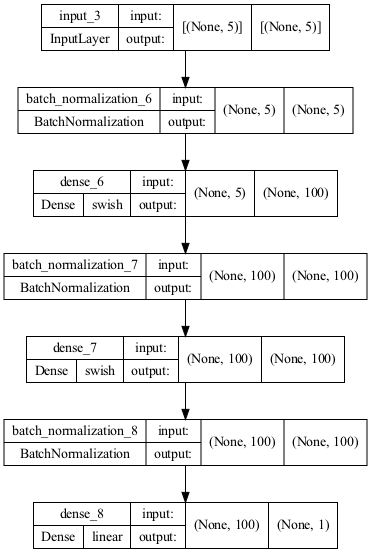

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

INFO:tensorflow:Assets written to: trained_models/bergomi/ffn/assets


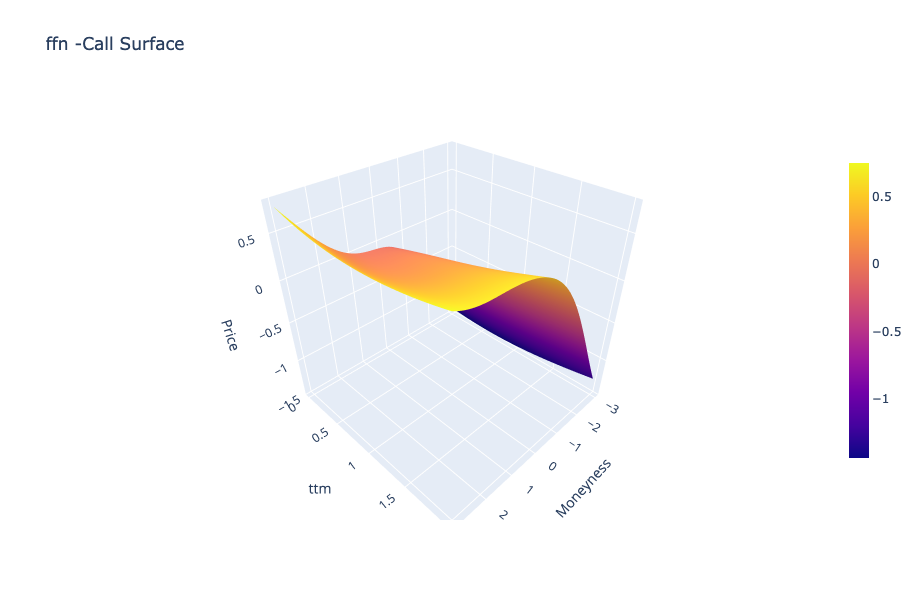

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 5)]          0           []                               
                                                                                                  
 batch_normalization_9 (BatchNo  (None, 5)           20          ['input_4[0][0]']                
 rmalization)                                                                                     
                                                                                                  
 dense_9 (Dense)                (None, 100)          600         ['batch_normalization_9[0][0]']  
                                                                                                  
 batch_normalization_10 (BatchN  (None, 100)         400         ['dense_9[0][0]']          

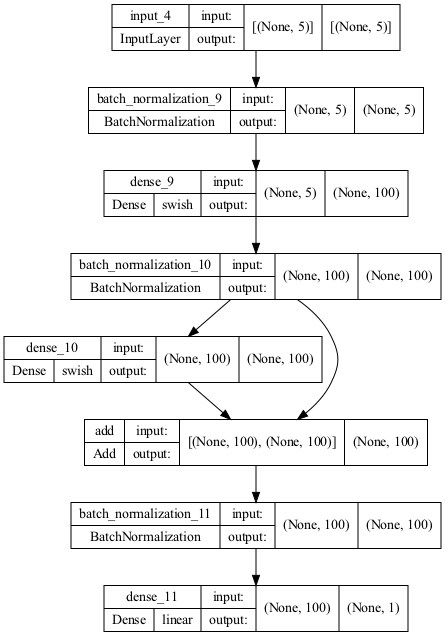

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

INFO:tensorflow:Assets written to: trained_models/bergomi/resnet/assets


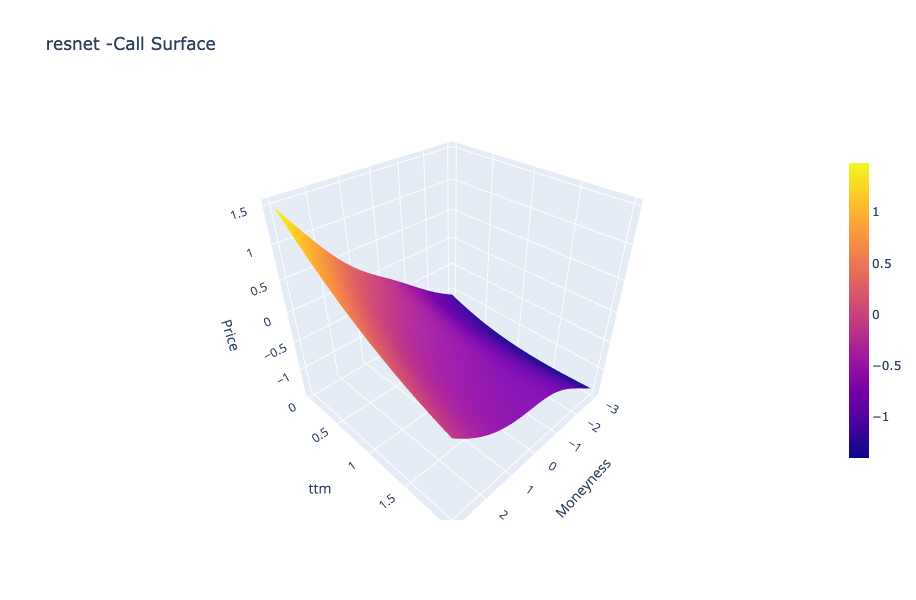

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 5)]          0           []                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, 5)           20          ['input_5[0][0]']                
 ormalization)                                                                                    
                                                                                                  
 ttm (Dense)                    (None, 1)            6           ['batch_normalization_12[0][0]'] 
                                                                                                  
 moneyness (Dense)              (None, 1)            6           ['batch_normalization_12[0]

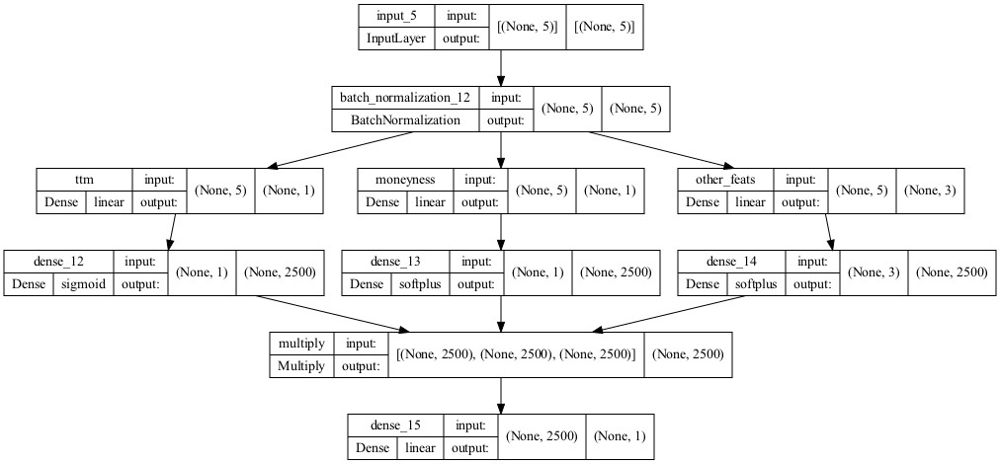

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

INFO:tensorflow:Assets written to: trained_models/bergomi/gated/assets


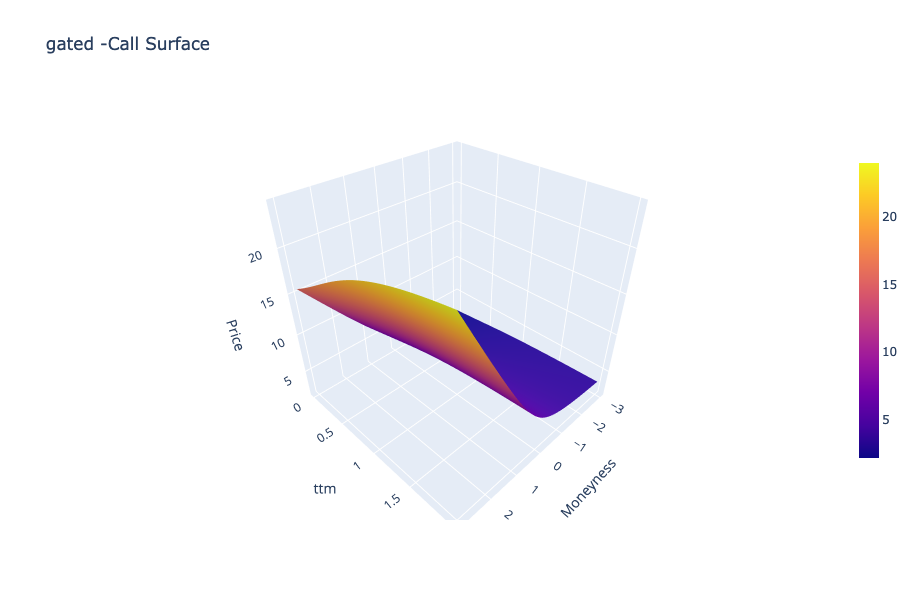

Model: "differential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 5)]               0         
                                                                 
 batch_normalization_13 (Bat  (None, 5)                20        
 chNormalization)                                                
                                                                 
 dense_16 (Dense)            (None, 100)               600       
                                                                 
 batch_normalization_14 (Bat  (None, 100)              400       
 chNormalization)                                                
                                                                 
 dense_17 (Dense)            (None, 100)               10100     
                                                                 
 batch_normalization_15 (Bat  (None, 100)       

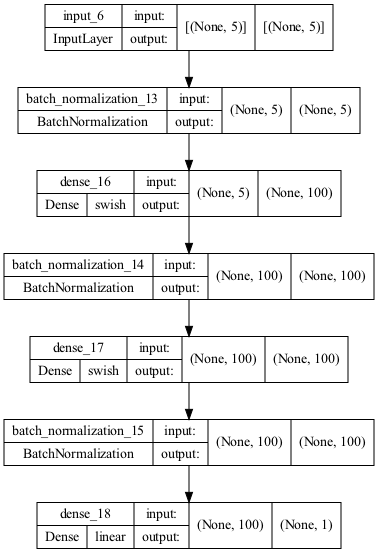

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

INFO:tensorflow:Assets written to: trained_models/bergomi/differential/assets


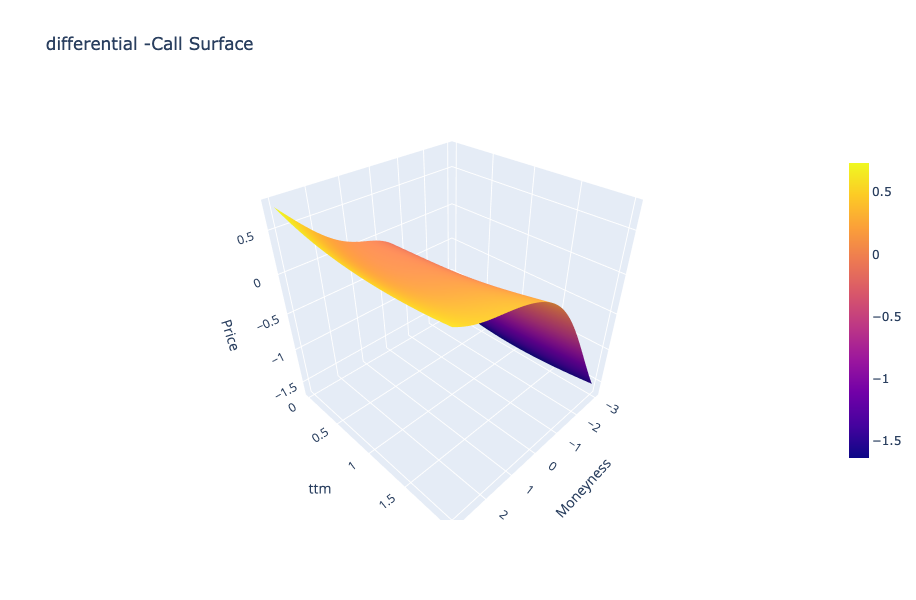

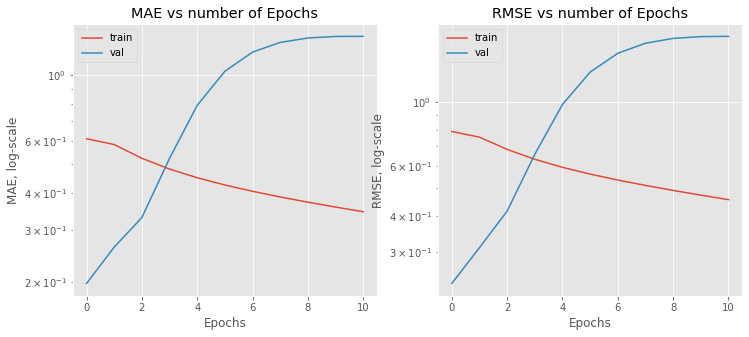

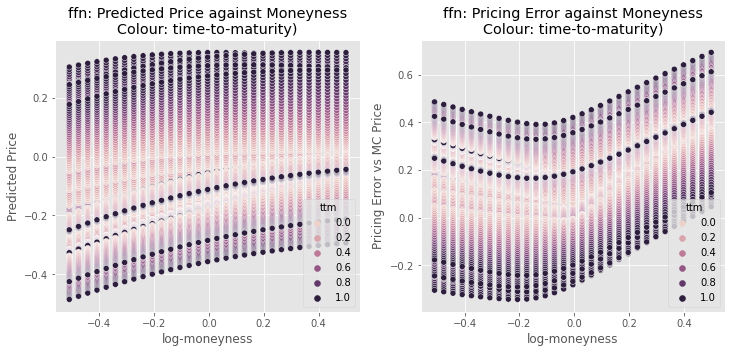

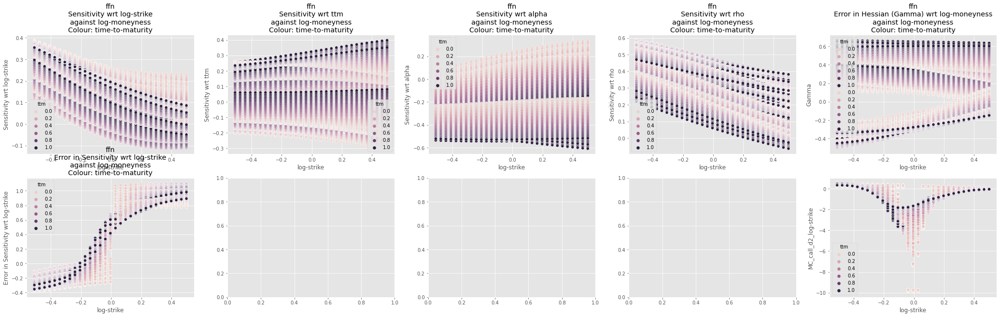

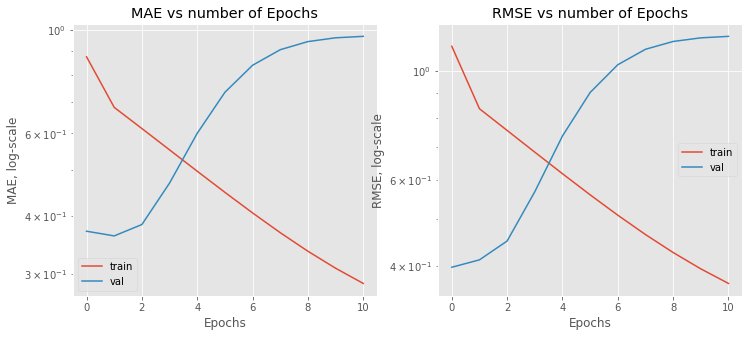

...

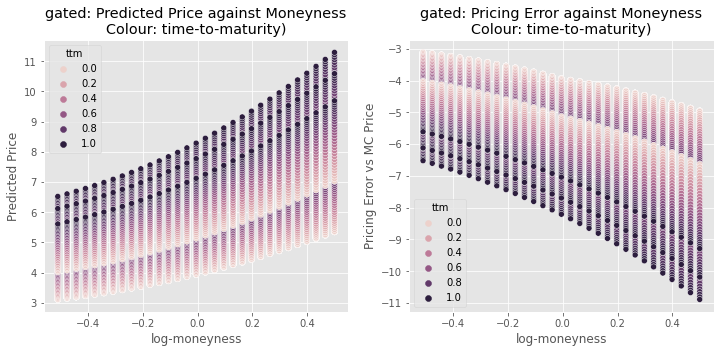

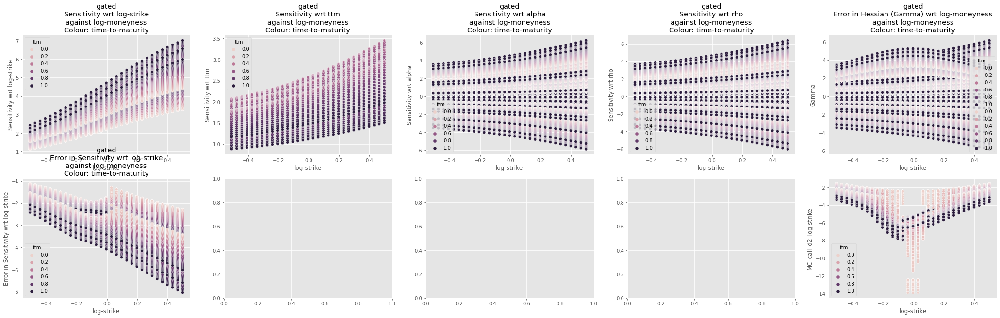

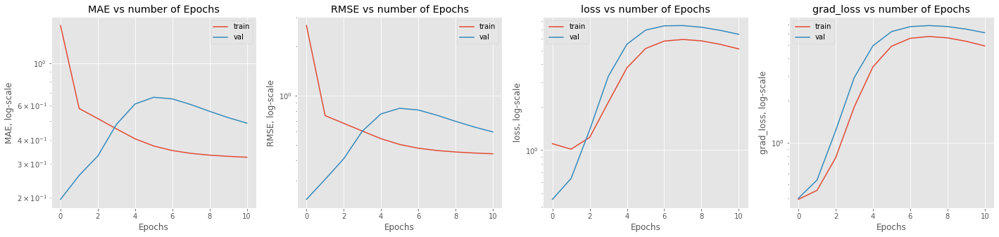

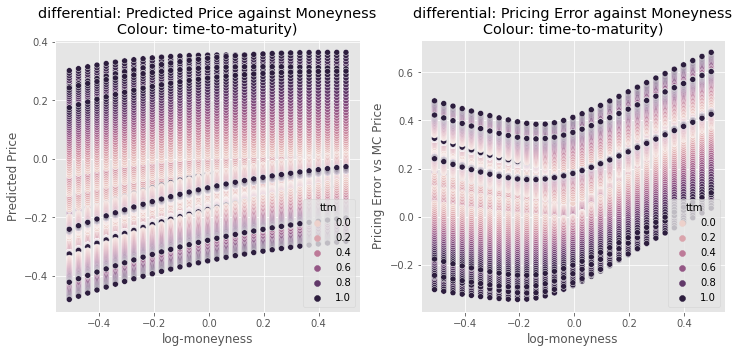

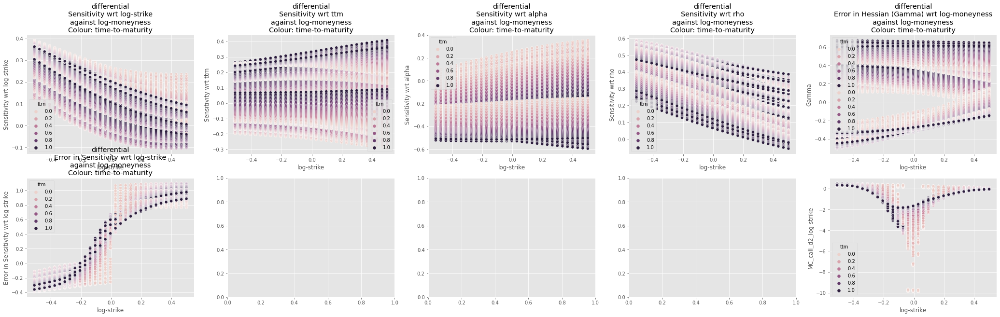

In [10]:
### define the neural network architecture
for METHOD in ["ffn", "resnet", "gated", "differential"]:
    metrics_to_add = []
    if METHOD == "differential":
        diff_model = make_model(**nn_params)
        all_models[METHOD] = DifferentialModel(diff_model.input, diff_model.output)
        all_models[METHOD].set_params(grad_loss_fn=tf.keras.losses.MeanSquaredError(), lam = 1.0)
        metrics_to_add  = ['loss','grad_loss']
    elif METHOD == "gated":
        nn_params2 = nn_params.copy()
        nn_params2['hidden_units'] = (nn_params2['hidden_units'] ** 2) / 4
        for param in ['n_layers', 'hidden_act', 'output_act', 'dropout_ratio']:
            nn_params2.pop(param)
        all_models[METHOD] = homogeneity_network(**nn_params2)
        gated_network_instantiate(all_models[METHOD], f_to_i, feat_map ={"ttm":"ttm", "moneyness":"log-strike"})
    elif METHOD == "resnet":
        nn_params2 = nn_params.copy()
        nn_params2['resnet'] = True
        all_models[METHOD] = make_model(**nn_params2)
    else:
        all_models[METHOD] = make_model(**nn_params)
    opt = Adam(learning_rate=ExponentialDecay(LR, decay_steps=500,
        decay_rate=0.95,
    ))
    ### re-instantiate the optimizer, and compile the neural network
    all_models[METHOD].compile(optimizer=opt, **compile_params)
    ### summarize model
    all_models[METHOD].summary()
    display(tf.keras.utils.plot_model(
        all_models[METHOD], show_layer_activations=True, show_shapes=True, dpi=72
    ))
    #### Training
    try:
        #### try loading the model from disk
        all_models[METHOD] = tf.keras.models.load_model(f"trained_models/bergomi/{METHOD}")
    except:
        ### if not found, retrain
        if METHOD == "differential":
            train_time, history = train_nn(model = all_models[METHOD], 
                               Xs = Xs_train, 
                               ys = (ys_train, true_grads_train), 
                               fit_params = fit_params, 
                               metric_names = metric_names + metrics_to_add)
        else:
            train_time, history = train_nn(model = all_models[METHOD], 
                               Xs = Xs_train, 
                               ys = ys_train, 
                               fit_params = fit_params, 
                               metric_names = metric_names + metrics_to_add)
        all_models[METHOD].save(f"trained_models/bergomi/{METHOD}", save_format='tf')   
  
    #### Inference
    temp = bergomi_model_inference(all_models  = all_models, 
                                   all_model_preds = all_model_preds, 
                                   METHOD = METHOD, 
                                   all_model_grads = all_model_grads, 
                                   all_model_hessian = all_model_hessian,
                                   X_df_test = X_df_test, 
                                   Xs_test = Xs_test, 
                                   true = true, 
                                   feat_names = feat_names, 
                                   f_to_i = f_to_i, 
                                   intrinsic_val = intrinsic_val, 
                                   upper_bound = upper_bound)
    temp["train_time"] = train_time
    all_res += [temp.copy()]

# Neural Network Ensemble

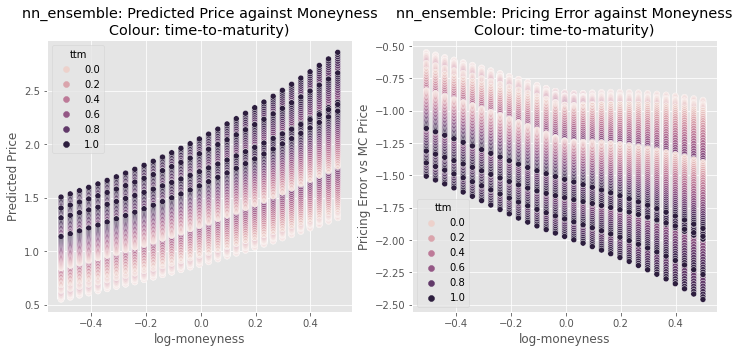

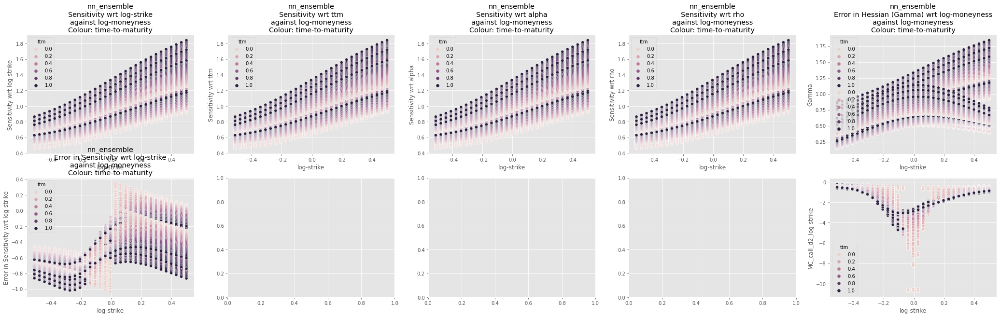

In [11]:
ensemble_preds = pd.DataFrame(all_model_preds).mean(axis=1).values
ensemble_hessian = pd.DataFrame({x:all_model_hessian[x][:, f_to_i("log-strike")] for x in all_model_hessian}).mean(axis = 1).values.reshape((-1, 1))
ensemble_grads = np.zeros((X_df_test.shape[0], N_FEATS))
for i in range(N_FEATS):
    ensemble_grads[:, i] =pd.DataFrame({x:all_model_grads[x][:,0] for x in all_model_grads}).mean(axis = 1).values
METHOD = "nn_ensemble"
temp = bergomi_eval_wrapper(
    X_df_test,
    true,
    ensemble_preds,
    ensemble_grads,
    ensemble_hessian,
    feat_names,
    lower_bound=intrinsic_val,
    upper_bound=upper_bound,
    METHOD=METHOD,
)

all_res += [temp.copy()]

# Polynomial Basis

7
HERE


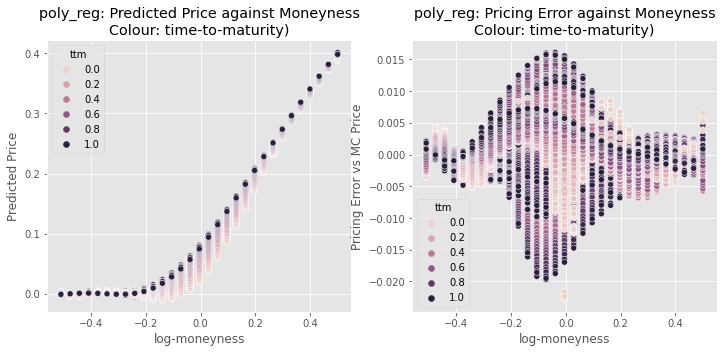

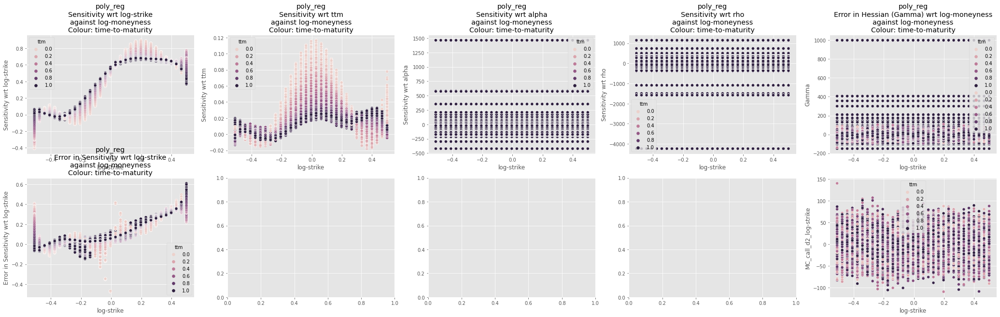

In [12]:
from nn_option_pricer.poly_reg import train_infer_poly
import math


METHOD = "poly_reg"
start = time.time()
degree = round((math.factorial(N_FEATS) * (nn_params["hidden_units"])) ** (1/ N_FEATS))
print(degree)
# spline = SplineTransformer(n_knots=5, degree=10, knots="uniform", extrapolation="linear")
train_time, inference_time = train_infer_poly(degree, Xs_train, ys_train, Xs_test, ys_test, feat_names, all_models, all_model_preds, all_model_grads, all_model_hessian, f_to_i, moneyness_var="log-strike", METHOD="poly_reg", eps=1e-4)
print("HERE")
temp = bergomi_eval_wrapper(
    X_df_test,
    true,
    all_model_preds[METHOD],
    all_model_grads[METHOD],
    all_model_hessian[METHOD],
    feat_names,
    lower_bound=intrinsic_val,
    upper_bound=upper_bound,
    METHOD=METHOD,
)


temp['train_time'] = train_time
temp["model_parameters"] = len(all_models[METHOD]['lr'].coef_)
temp['inference_time'] = inference_time
all_res += [temp.copy()]

In [75]:
Xs_train - Xs_test

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [51]:
model = make_model(**nn_params)
init_weights = model.layers[2].get_weights()[0]
model.compile(optimizer='Adam', **compile_params)
# train_nn(model, Xs_train, ys_train, fit_params, metric_names)
model.fit(Xs_train, ys_train, **fit_params)
final_weights = model.layers[2].get_weights()[0]

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

Training:   0%|                                         0/30 ETA: ?s,  ?epochs/s

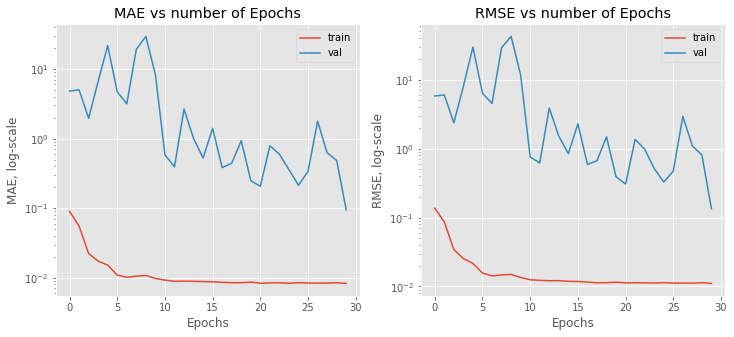

In [53]:
model = make_model(**nn_params)
init_weights2 = model.layers[2].get_weights()[0]
model.compile(optimizer='Adam', **compile_params)
train_nn(model, Xs_train, ys_train, fit_params, metric_names)
final_weights2 = model.layers[2].get_weights()[0]

<AxesSubplot:>

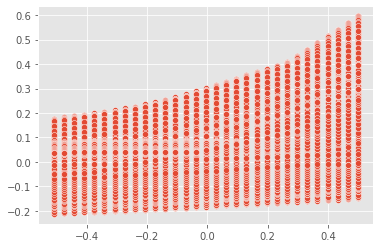

In [57]:
pred = model.predict(Xs_test, batch_size=10 ** 5).reshape(-1)
sns.scatterplot(Xs_test[:,0], pred)

# Results

In [83]:
res_df = (
    pd.concat(all_res)
    .reset_index()
    .drop_duplicates(subset=["index"], keep="last")
    .set_index("index")
    .T
)
print(res_df.to_latex(float_format = "%.5g"))
res_df.style.background_gradient(axis=1)
res_df.to_csv("BergomiResults.csv", index=False)

\begin{tabular}{lrrrrrr}
\toprule
index &      ffn &  resnet &  gated &  differential &  nn\_ensemble &  poly\_reg \\
\midrule
l1                    &  0.19389 & 0.37245 & 5.2669 &       0.19232 &       1.1471 & 0.0022891 \\
l2                    &  0.23207 & 0.40048 & 5.3859 &       0.22986 &        1.178 & 0.0032603 \\
l\_inf                 &  0.69401 & 0.95147 &  10.89 &       0.68272 &        2.459 &  0.022835 \\
lower\_bound\_violation &  0.71309 &  0.9353 &      0 &       0.71175 &            0 &   0.46727 \\
upper\_bound\_violation &        0 &       0 &      1 &             0 &       0.7489 &         0 \\
monotonicity\_error    & 0.054412 &       0 &      0 &      0.045213 &            0 &   0.16225 \\
time\_value\_error      &  0.36486 &       1 &      0 &       0.34704 &            0 &   0.17599 \\
convex\_error          &  0.98709 & 0.73819 &      0 &       0.98668 &            0 &   0.46227 \\
model\_parameters      &    11621 &   11621 &  22550 &         11627 &          